# Analysis for compiling behavioral experiment stimuli

The aim of this notebook is to prepare the stimuli that will be used in the behavioral experiment. To do so, we perform some analyses on datasets to evaluate how a model can *place* a speaker in its encoding space. How do models encode speakers' identities? How far are these encoded representations from each other? Would the distances between speaker in this space correlate to the ability of a model to recognize them properly? e.g. the further the speakers from each other the easier for the model to discriminate.

Accordingly, we compute different metrics across speakers' utterances to first show correlations between recognizability and distance/similarity variables. Then, indicate which variable is more convenient to compile the stimuli based on it.

In [84]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import soundfile as sf
import deciphering_enigma
import matplotlib.pyplot as plt

In [2]:
import matplotlib
from pylab import cm
import matplotlib as mpl
matplotlib.font_manager._fmcache
matplotlib.font_manager._rebuild()
mpl.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.linewidth'] = 3

## TIMIT

### 1) Load Dataset with Metadata

In [3]:
#define the experiment config file path
path_to_config = './config.yaml'

#read the experiment config file
exp_config = deciphering_enigma.load_yaml_config(path_to_config)
dataset_path = exp_config.dataset_path

#register experiment directory and read wav files' paths
audio_files = deciphering_enigma.build_experiment(exp_config)
audio_files = [audio for audio in audio_files if audio.endswith('_normloud.wav')]
print(f'Dataset has {len(audio_files)} samples')

#extract metadata from file name convention
metadata_df, audio_format = deciphering_enigma.extract_metadata(exp_config, audio_files)
metadata_df['AudioPath'] = audio_files
metadata_df['ID'] = np.array(list(map(lambda x: x.split('/')[-2][1:], audio_files)))
metadata_df['Gender'] = np.array(list(map(lambda x: x.split('/')[-2][0], audio_files)))
metadata_df.drop(columns=['xx'], inplace=True)

dur = []
for file in tqdm(audio_files):
    audio, sr = sf.read(file)
    assert sr == 16000
    dur.append(len(audio)/sr)
metadata_df['Duration'] = dur
metadata_df

Dataset has 6300 samples


100%|█████████████████████████████████████████████████████████████████████████████████████| 6300/6300 [00:10<00:00, 610.08it/s]


,AudioNames,Label,AudioPath,ID,Gender,Duration
0,SA1_normloud.wav,SA1,/om2/user/gelbanna/datasets/TIMIT/TEST/DR1/FAK...,AKS0,F,3.968000
1,SA2_normloud.wav,SA2,/om2/user/gelbanna/datasets/TIMIT/TEST/DR1/FAK...,AKS0,F,3.628812
2,SI1573_normloud.wav,SI1573,/om2/user/gelbanna/datasets/TIMIT/TEST/DR1/FAK...,AKS0,F,4.972812
3,SI2203_normloud.wav,SI2203,/om2/user/gelbanna/datasets/TIMIT/TEST/DR1/FAK...,AKS0,F,3.513625
4,SI943_normloud.wav,SI943,/om2/user/gelbanna/datasets/TIMIT/TEST/DR1/FAK...,AKS0,F,3.756813
...,...,...,...,...,...,...
6295,SX172_normloud.wav,SX172,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR8/MT...,TCS0,M,2.809625
6296,SX262_normloud.wav,SX262,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR8/MT...,TCS0,M,2.387250
6297,SX352_normloud.wav,SX352,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR8/MT...,TCS0,M,3.955250
6298,SX442_normloud.wav,SX442,/om2/user/gelbanna/datasets/TIMIT/TRAIN/DR8/MT...,TCS0,M,3.545625


### 2) Preprocessing Data

### (Select Duration from 2.8 to 3s/Normalize Loudness/Convert to tensors)

In [6]:
metadata_df = metadata_df.loc[(metadata_df.Duration <= 3) & (metadata_df.Duration >= 2.8)]
print(f'Number of speakers: {metadata_df.ID.unique().shape[0]}')
print(f'Number of utterances: {len(metadata_df)}')

Number of speakers: 416
Number of utterances: 655


In [5]:
#load audio files as torch tensors to get ready for feature extraction
audio_tensor_list = deciphering_enigma.load_dataset(list(metadata_df.AudioPath), cfg=exp_config, speaker_ids=metadata_df['ID'], audio_format=audio_format, 
                                                    norm_loudness=exp_config.norm_loudness, target_loudness=exp_config.target_loudness)

Audio Tensors are already saved for timit_benchmark


### 3) Extract Speech Embeddings

In [6]:
#generate speech embeddings
feature_extractor = deciphering_enigma.FeatureExtractor()
embeddings_dict = feature_extractor.extract(audio_tensor_list, exp_config)

Load HuBERT_best Model
HuBERT_best embeddings are already saved for timit_benchmark
(6300, 1280)


### 4) Cosine Distance

We computed the cosine distances across the embeddings extracted from all utterances in TIMIT (6300) using the best-performing layer in **HuBERT** on TIMIT dataset (Transformer layer 7). Then, we averaged the distances for each speaker to evaluate how *far* one speaker from the rest. The results are shown in the form of a heatmap for all 630 speakers and their distances between each other.

In [38]:
#Load the cosine distances across speakers in a long form
df_long = pd.read_csv(f'../{exp_config.dataset_name}/HuBERT_best/longform_cosine.csv')
#Average cosine values for each speakerX-speakerY pair
df_averaged = pd.DataFrame(df_long.groupby(['ID_1', 'ID_2'])['Distance'].mean()).reset_index()
#Convert long form df to pairwise
df_cosine = df_averaged.pivot(index='ID_1', columns='ID_2', values='Distance')

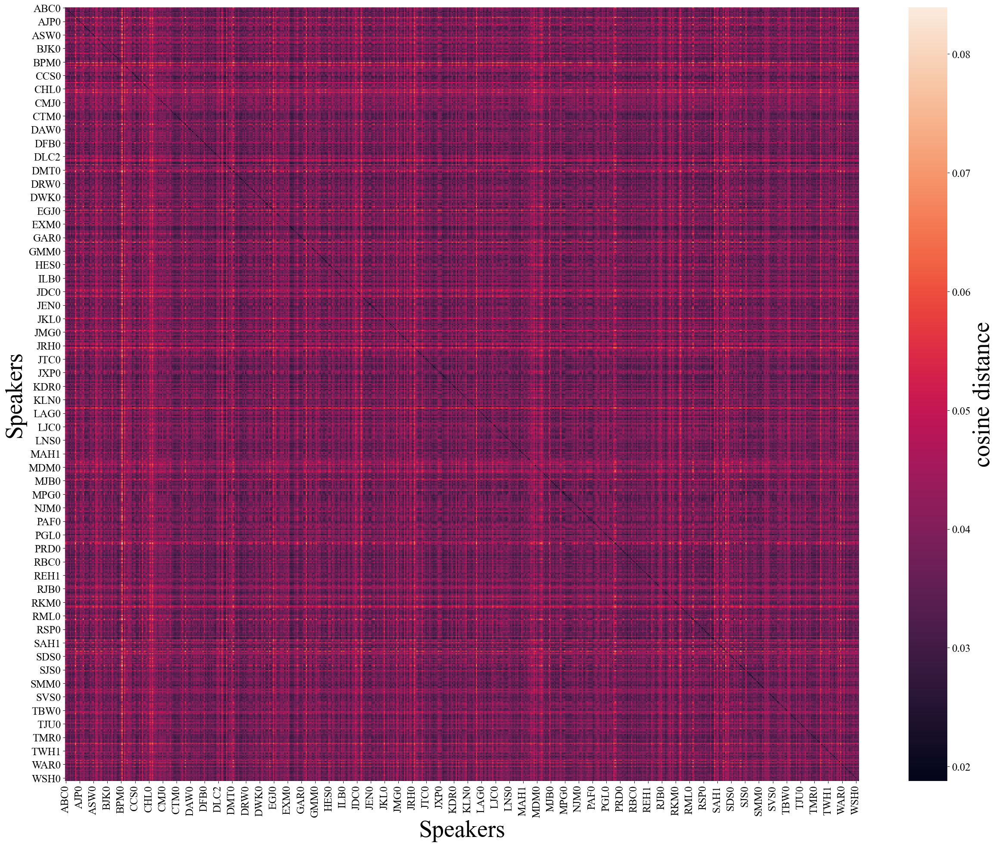

In [9]:
#Plot cosine distances across all speakers
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_cosine, ax=ax)
ax.figure.axes[-1].set_ylabel('cosine distance', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()

The speakers in the y-axis are then sorted from the highest distance to lowest, as shown below. Thus, the speaker on the top is the furthest on average to all speakers, meaning that this speaker is more distinct or unique. In simpler terms, the speakers are sorted from unique voices to more common and average voices.

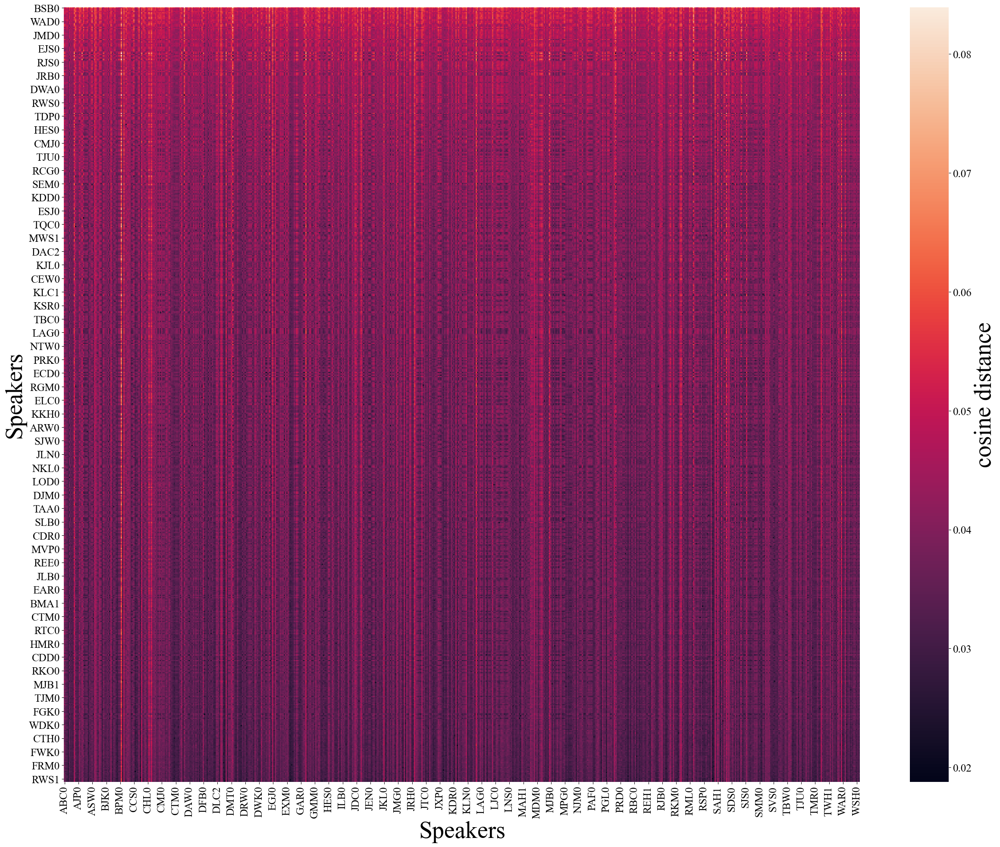

In [10]:
#Plot more-least common voice matrix
df_cosine_sorted = df_cosine.assign(m=df_cosine.mean(axis=1)).sort_values('m', ascending=False).drop('m', axis=1)
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_cosine_sorted, ax=ax)
ax.figure.axes[-1].set_ylabel('cosine distance', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()

In [29]:
#Sample from the speaker with the largest cosine distance on average
import IPython
print(f'Speaker with the largest cosine distance on average is {df_cosine_sorted.index[0]}')
IPython.display.Audio(list(metadata_df.loc[metadata_df.ID == df_cosine_sorted.index[0]]['AudioPath'])[0])

Speaker with the largest cosine distance on average is BSB0


In [31]:
#Sample from the speaker with the smallest cosine distance on average
import IPython
print(f'Speaker with the smallest cosine distance on average is {df_cosine_sorted.index[-1]}')
IPython.display.Audio(list(metadata_df.loc[metadata_df.ID == df_cosine_sorted.index[-1]]['AudioPath'])[0])

Speaker with the smallest cosine distance on average is DLR1


Below we plot the distribution of distances that were computed between different speakers against the ones computed between same speaker utterances.

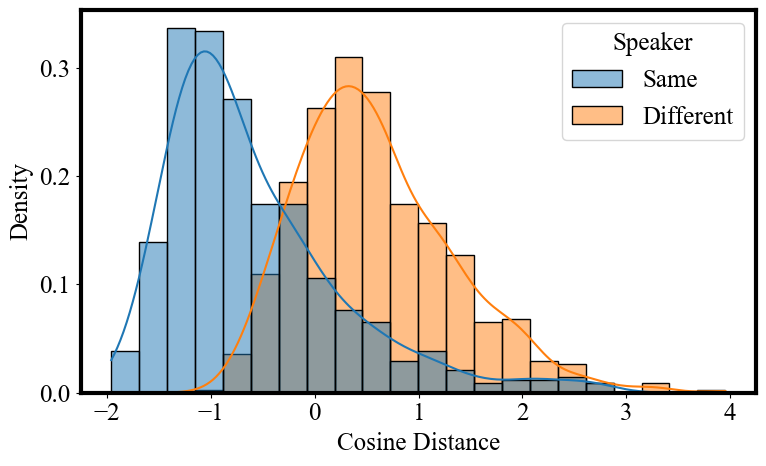

In [39]:
#Add column for same and different speakers
df_averaged['Speaker'] = df_averaged.apply(lambda x: 'Same' if x.ID_1 == x.ID_2 else 'Different', axis=1)
df_unique = df_averaged.drop_duplicates('Distance')

df_same = df_unique.loc[df_unique['Speaker'] == 'Same']
#Sample a rondom set from the distances from different speakers because the number of different is higher than same samples
df_diff =df_unique.loc[df_unique['Speaker'] == 'Different'].sample(len(df_unique.loc[df_unique['Speaker'] == 'Same']), random_state=42)
df_concat = pd.concat([df_same, df_diff])
#Standardize values
df_concat.Distance = (df_concat.Distance-df_concat.Distance.mean())/df_concat.Distance.std()

#Plot histogram for model
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
hist = sns.histplot(data=df_concat, x='Distance', hue='Speaker', ax=ax, kde=True, stat='density')
ax.set_ylabel('Density')
ax.set_xlabel('Cosine Distance')
plt.tight_layout()

### 5) Hausdorff Distance

In a similar vein, we performed the same analysis but with a different distance metric using *[Hausdorff Distance](https://en.wikipedia.org/wiki/Hausdorff_distance)*.

In [26]:
#Load the hausdorff distances across speakers in a long form
df_long = pd.read_csv(f'../{exp_config.dataset_name}/HuBERT_best/longform_hausdorff.csv')
#Average hausdorff values for each speakerX-speakerY pair
df_averaged = pd.DataFrame(df_long.groupby(['ID_1', 'ID_2'])['Distance'].mean()).reset_index()
#Convert long form df to pairwise
df_hausdorff = df_averaged.pivot(index='ID_1', columns='ID_2', values='Distance')

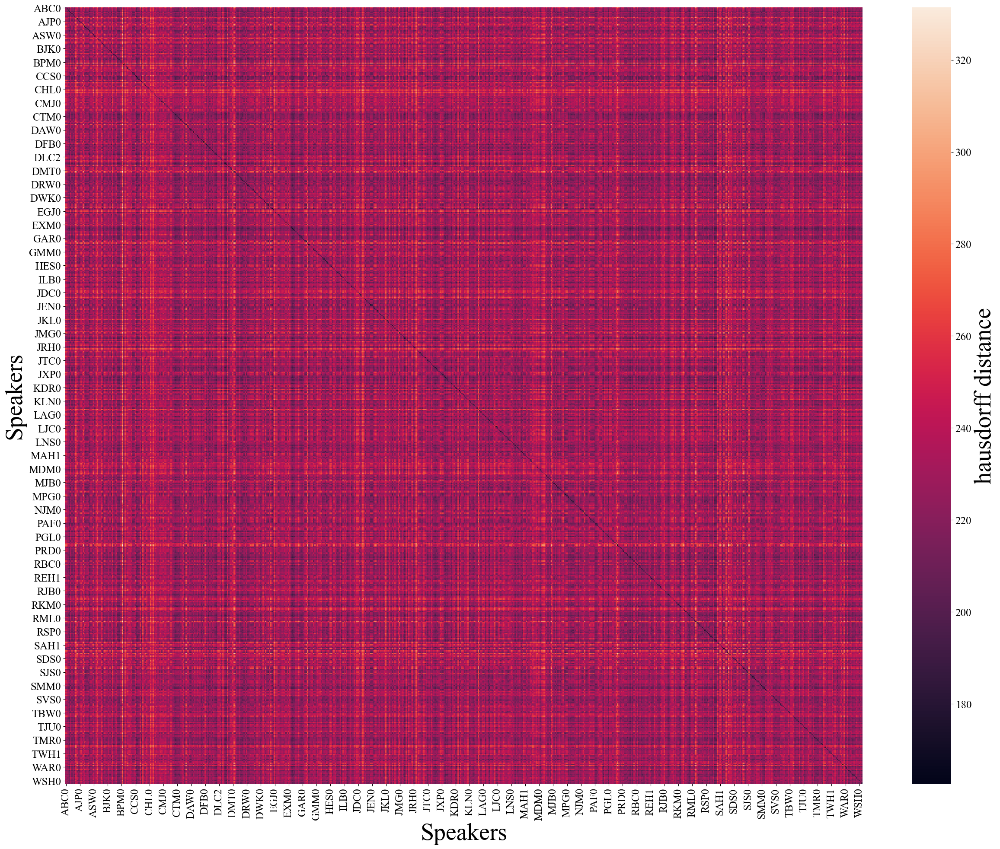

In [27]:
#Plot hausdorff distances across all speakers
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_hausdorff, ax=ax)
ax.figure.axes[-1].set_ylabel('hausdorff distance', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()

sorting speakers by their distance values as before.

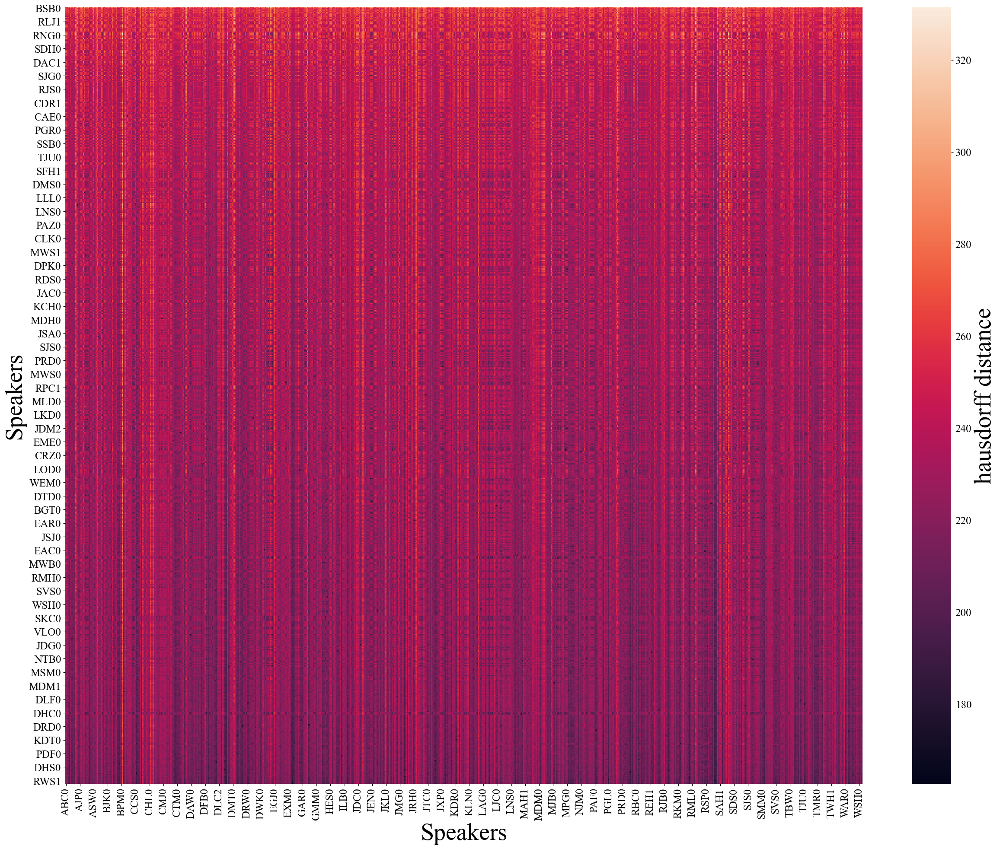

In [28]:
#Plot more-least common voice matrix
df_hausdorff_sorted = df_hausdorff.assign(m=df_hausdorff.mean(axis=1)).sort_values('m', ascending=False).drop('m', axis=1)
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_hausdorff_sorted, ax=ax)
ax.figure.axes[-1].set_ylabel('hausdorff distance', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()

In [32]:
#Sample from the speaker with the largest hausdorff distance on average
import IPython
print(f'Speaker with the largest hausdorff distance on average is {df_hausdorff_sorted.index[0]}')
IPython.display.Audio(list(metadata_df.loc[metadata_df.ID == df_hausdorff_sorted.index[0]]['AudioPath'])[0])

Speaker with the largest hausdorff distance on average is BSB0


In [33]:
#Sample from the speaker with the largest hausdorff distance on average
import IPython
print(f'Speaker with the samllest hausdorff distance on average is {df_hausdorff_sorted.index[-1]}')
IPython.display.Audio(list(metadata_df.loc[metadata_df.ID == df_hausdorff_sorted.index[-1]]['AudioPath'])[0])

Speaker with the samllest hausdorff distance on average is FMC0


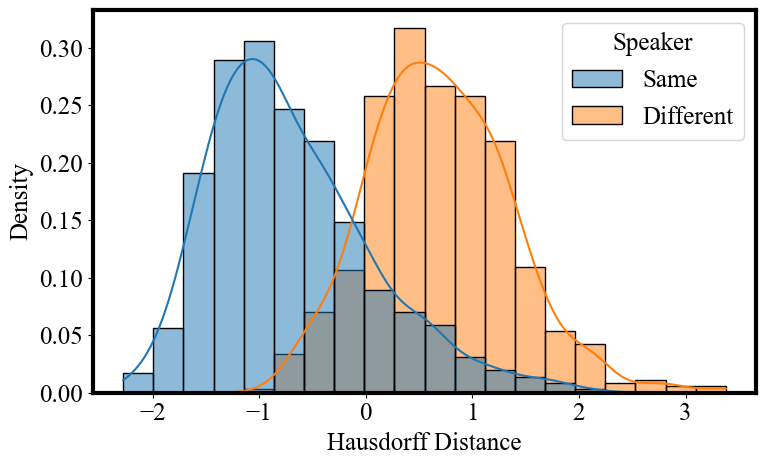

In [37]:
#Add column for same and different speakers
df_averaged['Speaker'] = df_averaged.apply(lambda x: 'Same' if x.ID_1 == x.ID_2 else 'Different', axis=1)
df_unique = df_averaged.drop_duplicates('Distance')

df_same = df_unique.loc[df_unique['Speaker'] == 'Same']
#Sample a rondom set from the distances from different speakers because the number of different is higher than same samples
df_diff =df_unique.loc[df_unique['Speaker'] == 'Different'].sample(len(df_unique.loc[df_unique['Speaker'] == 'Same']), random_state=42)
df_concat = pd.concat([df_same, df_diff])
#Standardize values
df_concat.Distance = (df_concat.Distance-df_concat.Distance.mean())/df_concat.Distance.std()

#Plot histogram for model
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
hist = sns.histplot(data=df_concat, x='Distance', hue='Speaker', ax=ax, kde=True, stat='density')
ax.set_ylabel('Density')
ax.set_xlabel('Hausdorff Distance')
plt.tight_layout()

### 6) Spearman Correlation

We also explore *Spearman Correlation* as a metric to evaluate how close/far are speaker's representations from others.

In [40]:
#Load the simlarity measures across speakers in a long form
df_long = pd.read_csv(f'../{exp_config.dataset_name}/HuBERT_best/longform_spearman.csv')
#Average similarity values for each speaker-speaker pair
df_averaged = pd.DataFrame(df_long.groupby(['ID_1', 'ID_2'])['Distance'].mean()).reset_index()
#Convert long form df to pairwise
df_spearman = df_averaged.pivot(index='ID_1', columns='ID_2', values='Distance')

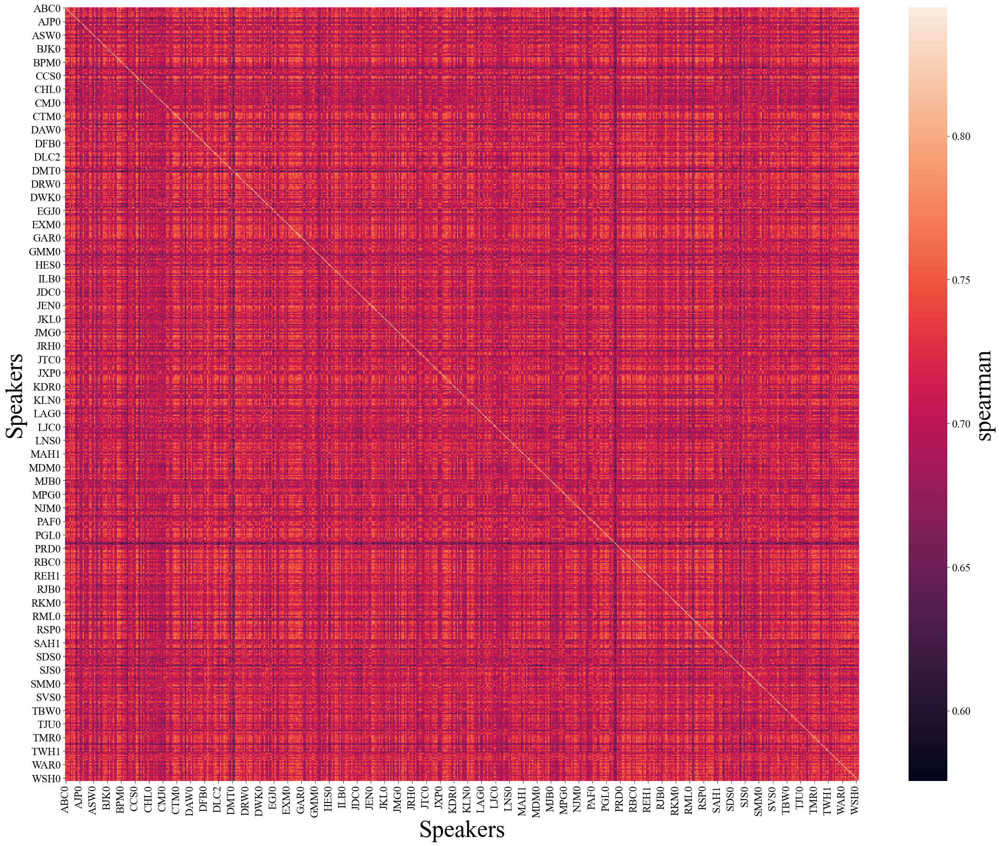

In [42]:
#Plot similarity values across all speakers
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_spearman, ax=ax)
ax.figure.axes[-1].set_ylabel('spearman', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()

In a similar vein, we sort the speakers from lower similarity values to higher similarity on average. That way we could also present speakers from unique to common as well.

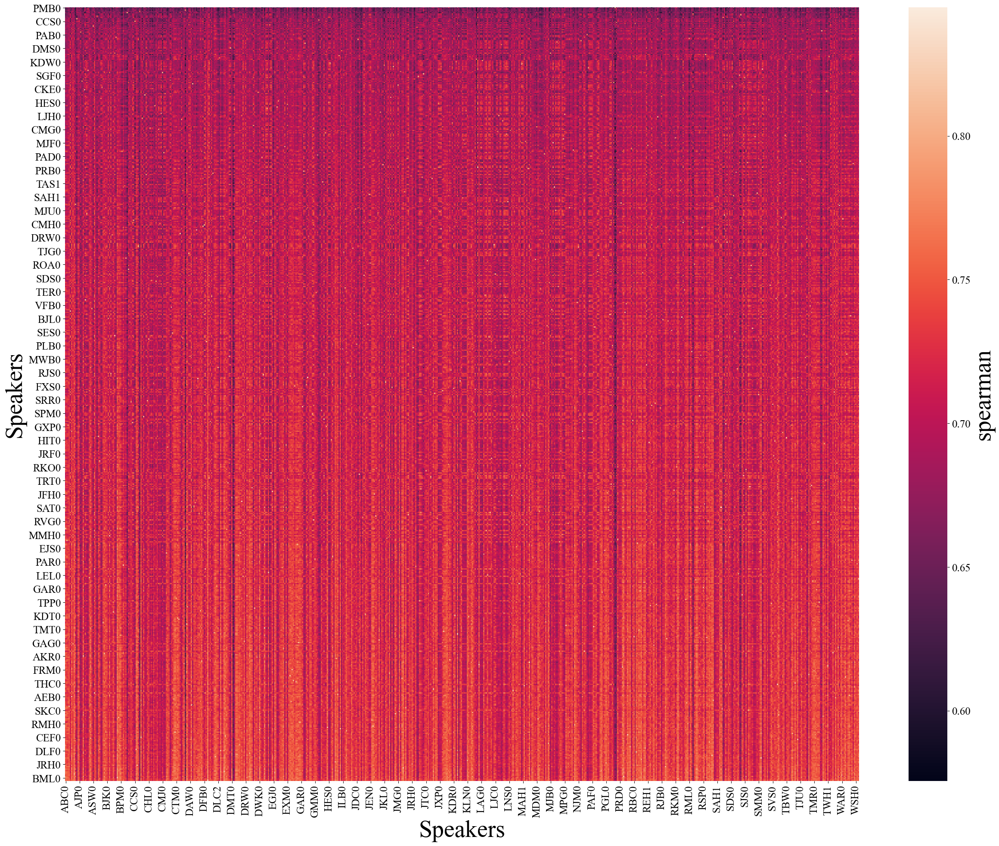

In [44]:
#Plot least-more common voice matrix
df_spearman_sorted = df_spearman.assign(m=df_spearman.mean(axis=1)).sort_values('m', ascending=True).drop('m', axis=1)
fig, ax = plt.subplots(1, 1, figsize=(25, 20))
ax = sns.heatmap(df_spearman_sorted, ax=ax)
ax.figure.axes[-1].set_ylabel('spearman', size=40)
ax.set_xlabel('Speakers', fontsize=40)
ax.set_ylabel('Speakers', fontsize=40)
plt.tight_layout()

In [45]:
#Sample from the speaker with the lowest similarity on average
import IPython
print(f'Speaker with the lowest similarity on average is {df_spearman_sorted.index[0]}')
IPython.display.Audio(list(metadata_df.loc[metadata_df.ID == df_spearman_sorted.index[0]]['AudioPath'])[0])

Speaker with the lowest similarity on average is PMB0


In [46]:
#Sample from the speaker with the highest similarity on average
import IPython
print(f'Speaker with the highest similarity on average is {df_spearman_sorted.index[-1]}')
IPython.display.Audio(list(metadata_df.loc[metadata_df.ID == df_spearman_sorted.index[-1]]['AudioPath'])[0])

Speaker with the highest similarity on average is DHS0


Also, we plot the distributions of spearman correlation in case of same and different speakers

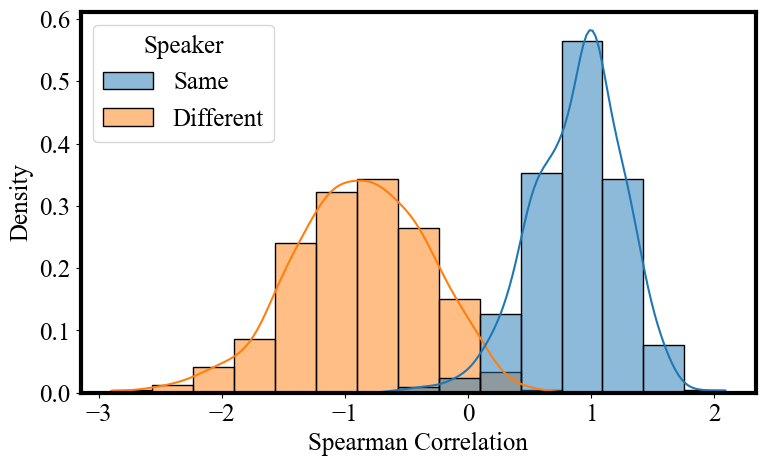

In [51]:
#Add column for same and different speakers
df_averaged['Speaker'] = df_averaged.apply(lambda x: 'Same' if x.ID_1 == x.ID_2 else 'Different', axis=1)
df_unique = df_averaged.drop_duplicates('Distance')

df_same = df_unique.loc[df_unique['Speaker'] == 'Same']
df_diff =df_unique.loc[df_unique['Speaker'] == 'Different'].sample(len(df_unique.loc[df_unique['Speaker'] == 'Same']), random_state=42)
df_concat = pd.concat([df_same, df_diff])
#Standardize values
df_concat.Distance = (df_concat.Distance-df_concat.Distance.mean())/df_concat.Distance.std()

#Plot histogram for model
fig, ax = plt.subplots(1, 1, figsize=(8, 5))
hist = sns.histplot(data=df_concat, x='Distance', hue='Speaker', ax=ax, kde=True, stat='density')
ax.set_ylabel('Density')
ax.set_xlabel('Spearman Correlation')
plt.tight_layout()

### 7) Confusion Matrix

Another way to evaluate how the model perceive speakers' identities and how close/far the model encode voices in its perceptual space is by evaluating which speakers the model gets confused between. This might be considered as a proxy for distances between speakers, the closer they are the more difficult for the model to recognize them. Accordingly, we computed a confusion matrix to show how many times the model misidentified one speaker with another. We implemented this experiment by bootstrapping the voice recognition task on HuBERT best layer representations for 10,000 trials. Each trial we randomly sample 7 utterances from each speaker for training and keep 3 for testing. We saved the predictions for each trial in addition to the ground truth. Then count the times the model misidentified each speaker with another speaker and plot it as heatmap.

In [52]:
from ast import literal_eval
df_bootstrap = pd.read_csv(f'../{exp_config.dataset_name}/HuBERT_best/HuBERT_best_bootstrap_predictions.csv')
df_bootstrap['ID'] = df_bootstrap['ID'].apply(lambda x: literal_eval(x))
df_bootstrap['Pred'] = df_bootstrap['Pred'].apply(lambda x: literal_eval(x))

In [53]:
df_bootstrap_long = df_bootstrap.explode(['ID', 'Pred']).drop(columns=['Unnamed: 0'])
#Remove the true Identifications (model prediction == ground truth)
df_bootstrap_long = df_bootstrap_long.loc[df_bootstrap_long.ID != df_bootstrap_long.Pred]
df_bootstrap_long['count'] = 1
df_bootstrap_long = df_bootstrap_long.groupby(['ID', 'Pred']).count().reset_index()
#Compute the log of counts for better visualization
df_bootstrap_long['log_count'] = np.log(df_bootstrap_long['count'])
df_bootstrap_pairwise = df_bootstrap_long.pivot(index='ID', columns='Pred', values='log_count').fillna(0)
df_bootstrap_sorted_pairwise = df_bootstrap_pairwise.assign(m=df_bootstrap_pairwise.sum(axis=1)).sort_values('m').drop('m', axis=1)

Below we plot the confusion matrix with speakers sorted from least to most false identifications meaning that top speakers on the y-axis were relatively easy for the model to identify, hence, unique. While the speakers in the bottom were more difficult to the model to properly identify.

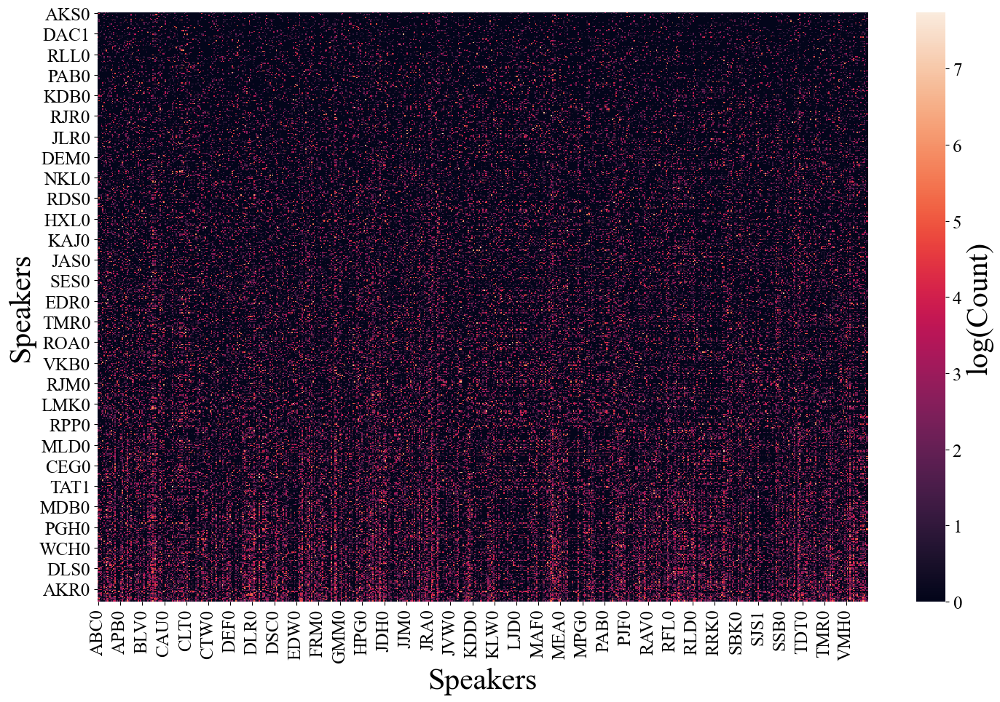

In [54]:
#Plot confusion matrix across all speakers
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
ax = sns.heatmap(df_bootstrap_sorted_pairwise, ax=ax)
ax.figure.axes[-1].set_ylabel('log(Count)', size=30)
ax.set_xlabel('Speakers', fontsize=30)
ax.set_ylabel('Speakers', fontsize=30)
plt.tight_layout()

In [57]:
#Sample from the speaker with least amount of misidentifications
import IPython
IPython.display.Audio(list(metadata_df.loc[metadata_df.ID == 'AKS0']['AudioPath'])[0])

In [58]:
#Sample from the speaker (WAD0) with most amount of misidentifications
import IPython
IPython.display.Audio(list(metadata_df.loc[metadata_df.ID == 'WAD0']['AudioPath'])[0])

In [59]:
#Sample from the speaker that was mostly confused with WAD0
speaker = df_bootstrap_sorted_pairwise['WAD0'].idxmax()
IPython.display.Audio(list(metadata_df.loc[metadata_df.ID == speaker]['AudioPath'])[0])

### 7) Relations between measured variables

It is worth mentioning that the TIMIT dataset comprises utterances with variable durations. The duration average of clips is *3.1±0.8 seconds. Accordingly, it is important to examine if clip duration is a confounding variable for model's performance. Thus, in this subsection, we plotted the relation of the variables measured above with duration and each other.

In [69]:
#Get the average cosine values for each speaker
cosine = list(df_cosine_sorted.mean(axis=1))
ID = list(df_cosine_sorted.index)
df_cos = pd.DataFrame({'ID': ID, 'Cosine': cosine})

#Get the average hausdorff values for each speaker
hausdorff = list(df_hausdorff_sorted.mean(axis=1))
ID = list(df_hausdorff_sorted.index)
df_haus = pd.DataFrame({'ID': ID, 'Hausdorff': hausdorff})

#Get the average spearman values for each speaker
spearman = list(df_spearman_sorted.mean(axis=1))
ID = list(df_spearman_sorted.index)
df_spear = pd.DataFrame({'ID': ID, 'Spearman': spearman})

#Get the average misidentification values for each speaker
conf = list(df_bootstrap_long.groupby('ID')['count'].sum())
ID = list(df_bootstrap_sorted_pairwise.index)
df_conf = pd.DataFrame({'ID': ID, 'MisID_count': conf})

#Merge all variables in one dataframe on ID
df = df_cos.merge(df_spear, on='ID')
df = df.merge(df_haus, on='ID')
df = df.merge(df_conf, on='ID')
df = df.merge(metadata_df, on='ID')

In [70]:
duration = list(df.groupby('ID')['Duration'].mean())
df = df.drop_duplicates('Cosine')
df.drop(columns=['Label', 'AudioPath', 'AudioNames'], inplace=True)

In [71]:
df

,ID,Cosine,Spearman,Hausdorff,MisID_count,Gender,Duration
0,BSB0,0.057708,0.698441,274.540967,5669,M,2.348813
10,JRK0,0.051919,0.691541,260.618869,4786,M,3.558438
20,KRG0,0.051706,0.689616,257.622821,2590,M,3.027250
30,CKE0,0.051333,0.691896,259.915514,2567,F,3.833625
40,JDM0,0.051143,0.681867,259.821700,9477,M,3.539250
...,...,...,...,...,...,...,...
6250,RAB1,0.033326,0.729077,215.866267,6200,M,3.161625
6260,CEF0,0.033284,0.729121,215.460428,3133,M,3.360000
6270,RWS1,0.033171,0.730720,213.435116,5156,M,3.340813
6280,FMC0,0.032915,0.726754,212.936521,6118,M,3.910438


Below, you can find the scatter matrix showing the relation across all measured metrics (cosine, hausdorff, spearman and confusion) and duration

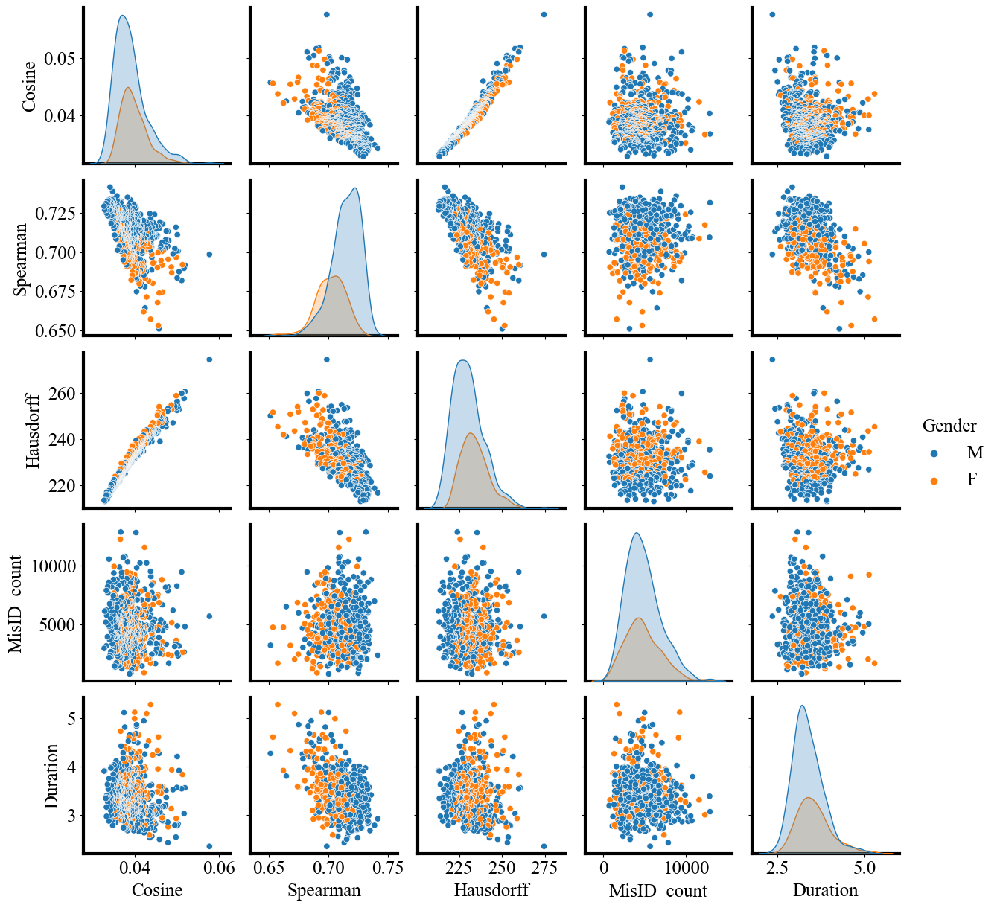

In [75]:
scatter_matrix = sns.pairplot(df, hue='Gender')

Then we explore in detail each variable

#### **Duration**

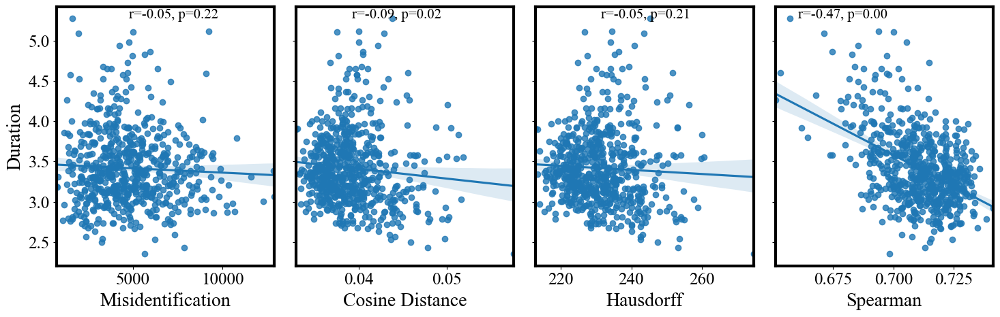

In [82]:
import scipy.stats as stats
#Plot the relation between duration and all variables
fig, ax = plt.subplots(1, 4, figsize=(15, 5), sharey=True)
ax = ax.flatten()

sns.regplot(data=df, y='Duration', x='MisID_count', ax=ax[0])
r, p = stats.pearsonr(df['Duration'], df['MisID_count'])
ax[0].text(df['MisID_count'].mean(), df['Duration'].max(), f"r={r:.2f}, p={p:.2f}", fontsize=15)
ax[0].set_xlabel('Misidentification', fontsize=20)
ax[0].set_ylabel('Duration', fontsize=20)

plot = sns.regplot(data=df, y='Duration', x='Cosine', ax=ax[1])
plot.set(ylabel=None)
r, p = stats.pearsonr(df['Duration'], df['Cosine'])
ax[1].text(df['Cosine'].mean(), df['Duration'].max(), f"r={r:.2f}, p={p:.2f}", fontsize=15)
ax[1].set_xlabel('Cosine Distance', fontsize=20)

plot = sns.regplot(data=df, y='Duration', x='Hausdorff', ax=ax[2])
plot.set(ylabel=None)
r, p = stats.pearsonr(df['Duration'], df['Hausdorff'])
ax[2].text(df['Hausdorff'].mean(), df['Duration'].max(), f"r={r:.2f}, p={p:.2f}", fontsize=15)
ax[2].set_xlabel('Hausdorff', fontsize=20)

plot = sns.regplot(data=df, y='Duration', x='Spearman', ax=ax[3])
plot.set(ylabel=None)
r, p = stats.pearsonr(df['Duration'], df['Spearman'])
ax[3].text(df['Spearman'].mean()-0.05, df['Duration'].max(), f"r={r:.2f}, p={p:.2f}", fontsize=15)
ax[3].set_xlabel('Spearman', fontsize=20)
plt.tight_layout()

#### **Misidentification**

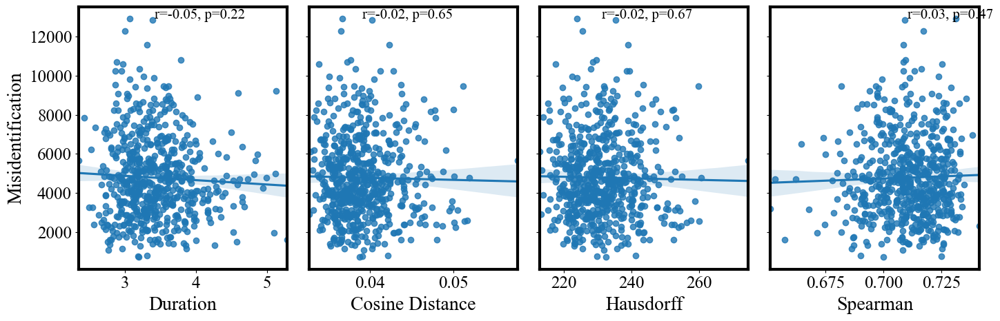

In [83]:
import scipy.stats as stats
#Plot the relation between duration and all variables
fig, ax = plt.subplots(1, 4, figsize=(15, 5), sharey=True)
ax = ax.flatten()

sns.regplot(data=df, y='MisID_count', x='Duration', ax=ax[0])
r, p = stats.pearsonr(df['MisID_count'], df['Duration'])
ax[0].text(df['Duration'].mean(), df['MisID_count'].max(), f"r={r:.2f}, p={p:.2f}", fontsize=15)
ax[0].set_xlabel('Duration', fontsize=20)
ax[0].set_ylabel('Misidentification', fontsize=20)

plot = sns.regplot(data=df, y='MisID_count', x='Cosine', ax=ax[1])
plot.set(ylabel=None)
r, p = stats.pearsonr(df['MisID_count'], df['Cosine'])
ax[1].text(df['Cosine'].mean(), df['MisID_count'].max(), f"r={r:.2f}, p={p:.2f}", fontsize=15)
ax[1].set_xlabel('Cosine Distance', fontsize=20)

plot = sns.regplot(data=df, y='MisID_count', x='Hausdorff', ax=ax[2])
plot.set(ylabel=None)
r, p = stats.pearsonr(df['MisID_count'], df['Hausdorff'])
ax[2].text(df['Hausdorff'].mean(), df['MisID_count'].max(), f"r={r:.2f}, p={p:.2f}", fontsize=15)
ax[2].set_xlabel('Hausdorff', fontsize=20)

plot = sns.regplot(data=df, y='MisID_count', x='Spearman', ax=ax[3])
plot.set(ylabel=None)
r, p = stats.pearsonr(df['MisID_count'], df['Spearman'])
ax[3].text(df['Spearman'].mean(), df['MisID_count'].max(), f"r={r:.2f}, p={p:.2f}", fontsize=15)
ax[3].set_xlabel('Spearman', fontsize=20)
plt.tight_layout()

It looks like the duration of utterances showed very low correlation with the number of misidentifications and cosine distances. However, there was a slight correlation between duration and spearman variable. That might indicate that the spearman metric is affected by the duration of the clip more than the uniqueness and closeness of voices. Especially, that it showed very low correlation with misidentifications. Also, spearman showed high correlation with cosine distances meaning that the further the representations the lower the similarity which is intuitive but doesn't look like the same behavior is shown between duration and cosine distances. 

Furthermore, it is interesting to see very low correlation between number of misidentifications and all distance and similarity metrics. This suggests that the MLP decoder trained for speaker recognition task learned a different metric to recognize speakers. Accordingly, the number of misidentifications aren't correlated with the other distance metrics.

That said, it would be worth training a decoder on a speaker discrimination task and evaluate the decoder's space compared the mentioned metrics. From there we could select a decision model above the frozen *HuBERT* encoder and test its performance against human subjects. **(To Be Continued)**